In [1]:
from shapely.geometry import Polygon
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from folium import plugins
import ipywidgets
import geocoder
import geopy

%matplotlib inline

In [2]:
camp = gpd.read_file('../data/TN_State_Parks_Campsites.geojson')
stock = gpd.read_file('../data/tn_restock.geojson')
access = gpd.read_file('../data/tn_access.geojson')
county = gpd.read_file('../data/tn-county-boundaries.geojson')

In [3]:
camp = camp[['TSP_CMPSTE_UID', 'TSP_CMPGRD_UID', 'SITE_NO', 'SITE_NAME',
       'ITINIO_ID', 'TSP_UID', 'PARK_NAME', 'geometry']]

In [4]:
camp.columns=["Park Campsite ID", "Park Campground ID", "Site No", "Site Name",
       'ITINIO_ID', "Park ID", "park_name", 'geometry']

In [5]:
camp['lon'] = camp['geometry'].x
camp['lat'] = camp['geometry'].y

In [6]:
camp_drop=camp.drop_duplicates(subset= 'park_name', keep= 'first')

In [7]:
camp_site=camp.drop_duplicates(subset= "Site Name", keep= 'first')

In [8]:
stock = stock.rename(columns={'LATITUDE': 'lat', 'LONGITUDE': 'lon'})

In [9]:
access = access.rename(columns={'Latitude': 'lat', 'Longitude': 'lon'})

In [10]:
pd.options.display.max_columns = None
stock.head(3)

,OBJECTID,SID,lat,lon,Site_Name,StreamName,CollectorName,Region,County,City,StockingProgram,WaterClass,Species,NumStocked,Management,PhoneNumber,HourAccess24,SunriseSunset,HoursOpen,ParkingType,ParkingSpaces,FishingPier,GlobalID,CreationDate,Creator,EditDate,Editor,Parking,DayClosure,DelayedHarvestSeason,DailyPermitRequired,lat_long,Google,geometry
0,1,26.0,35.454895,-86.786002,Big Rock Creek Greenway,Big Rock Creek,Big Rock Creek Greenway,2,MARSHALL,Lewisburg,Winter,stream,rainbow,700.0,City,None,None,No,Sunrise to Sunset,Paved,Greater Than 25,No,259a9f78-3430-4e0d-93c0-d842dd1203b0,2016-11-29T19:52:13+00:00,BH01507,2017-03-07T21:26:25+00:00,BH01306,None,None,None,No,"35.4548947690001,-86.7860016829999",None,POINT (-86.78601 35.45490)
1,2,27.0,35.157701,-86.016187,Cowan City Park,Boiling Fork Creek,Cowan City Park,2,FRANKLIN,Cowan,Winter,stream,rainbow,1050.0,City,None,None,No,Sunrise to Sunset,Gravel,Greater Than 25,No,befa0de6-655f-443d-adec-fb76cd6216c9,2016-11-29T19:52:13+00:00,BH01507,2017-03-07T21:26:25+00:00,BH01306,None,None,None,No,"35.1577006800001,-86.0161869889999",None,POINT (-86.01619 35.15771)
2,3,25.0,35.732254,-86.924202,Mccutcheon Creek,Mccutcheon Creek,McCutcheon Creek,2,MAURY,Spring Hill,Winter,stream,rainbow,1450.0,City,None,Yes,No,24,Gravel,Less Than 25,No,a4f3ea57-21e5-4c4d-9ffd-9d1e4e17091a,2016-11-29T19:52:13+00:00,BH01507,2017-03-07T21:26:25+00:00,BH01306,None,None,None,No,"35.732253916,-86.924202465",None,POINT (-86.92421 35.73226)


In [11]:
pd.options.display.max_columns = None
access.head(3)

,OBJECTID,Access_Num,lat,lon,Region,Area,County,Waterway,Data_Colle,Collection,Name,Alternate,Directions,Parking,Spaces,Trailer_Pa,Hours_Open,Ice,Bait,Camping,Comments,Ramps,Ramp_Struc,Lanes,Launchable,Gas,Owner,Manager,Date_Lease,Type,FourWheel,AccessFee,HandicapPark,LightedPark,OpenYearRound,ClosedMonths,HourAccess_24,SunriseSunset,ElectricHookup,WaterHookup,Restrooms,FishingPier,FishCleaning,CanoeLanding,WinterPool,CourtesyDock,MotorizedVessels,TrollingOnly,RentalOnly,RentalAvail,Lease_TWRA,IncludeWeb,created_user,created_date,last_edited_user,last_edited_date,Guide,PhotoName,MemberOnly,PumpOut,Website,geometry
0,2,2064.0,36.44812,-82.44343,4,Area 42,SULLIVAN,South Fork Holston River,,2008-12-18T00:00:00+00:00,SR 75 Bridge,,I-81 to Hwy. 36 (Fort Henry Drive) to SR 75.,Gravel,Less Than 25 Spaces,Less than 5,24 hour access,Proximity,Proximity,Proximity,Access to Boone Tailwater,1.0,Gravel,1,Up to 17 ft,Proximity,Prob. TDOT,Prob. TDOT,0,Boat Launch,No,No,No,No,Yes,No,Yes,No,No,No,No,No,No,Yes,Yes,No,Yes,No,No,No,No,Yes,None,None,BH01306,2015-10-23T20:31:13+00:00,2829,None,None,None,None,POINT (-82.44343 36.44813)
1,3,2054.0,35.94280,-83.17886,4,Area 42,COCKE,Pigeon River,,2009-01-27T00:00:00+00:00,Tannery Island,,From Newport take Hwy. 73,Dirt and Gravel,Less Than 25 Spaces,Less than 5,24 hour access,Proximity,Proximity,Proximity,Private property that is cuuretnly being used ...,1.0,Dirt,1,Up to 17 ft,Proximity,Private,Private,0,Boat Launch,No,No,No,No,Yes,No,Yes,No,No,No,No,No,No,Yes,Yes,No,Yes,No,No,No,No,Yes,None,None,BH01306,2015-10-23T20:31:13+00:00,2829,None,None,None,None,POINT (-83.17886 35.94281)
2,4,2057.0,36.49595,-82.68752,4,Area 42,HAWKINS,Holston River,,2009-06-02T00:00:00+00:00,Laurel Run Park,,Hwy. 11W to Goshen Valley Rd. to River Rd. to ...,Gravel,Less Than 25 Spaces,Less than 5,24 hour access,Proximity,Proximity,Proximity,Launch for canoes and small boats,1.0,Concrete,1,Up to 17 ft,Proximity,City,City,0,Boat Launch,No,No,Yes,No,No,Yes,No,No,No,No,No,No,No,Yes,Yes,No,Yes,No,No,No,No,Yes,None,None,BH01306,2015-10-23T20:31:13+00:00,2829,None,None,None,None,POINT (-82.68752 36.49596)


In [12]:
access.Waterway.value_counts()

Kentucky Reservoir       74
Old Hickory Reservoir    62
Watts Bar Reservoir      53
Norris Reservoir         51
Chickamauga Reservoir    50
                         ..
Marrowbone Lake           1
Sycamore Lake             1
Beach Lake                1
Lake Lindsey              1
Doe Creek                 1
Name: Waterway, Length: 120, dtype: int64

In [13]:
stock.StreamName.value_counts()

Tellico River              95
Gulf Fork Big Creek        42
Paint Creek                25
N Indian Creek             24
Stoney Creek               23
                           ..
Edmund-Orgill Park Pond     1
Shoal Creek                 1
Cedar Hill Park Pond        1
Lake Graham                 1
Stones River                1
Name: StreamName, Length: 147, dtype: int64

In [14]:
stock=stock.dropna(subset=['lat'])

In [15]:
access=access.dropna(subset =['lat'])

In [16]:
#county['lon'] = county['geometry'].x
#county['lat'] = county['geometry'].y

In [17]:
county.columns

Index(['intptlat', 'countyfp_nozero', 'name', 'cbsafp', 'funcstat', 'intptlon',
       'lsad', 'stusab', 'classfp', 'awater', 'countyfp', 'geoid', 'aland',
       'countyns', 'mtfcc', 'namelsad', 'statefp', 'state_name', 'csafp',
       'geometry'],
      dtype='object')

In [18]:
county.head()

,intptlat,countyfp_nozero,name,cbsafp,funcstat,intptlon,lsad,stusab,classfp,awater,countyfp,geoid,aland,countyns,mtfcc,namelsad,statefp,state_name,csafp,geometry
0,+36.1409404,141,Putnam,18260,A,-085.4961801,06,TN,H1,3777708,141,47141,1038860580,01639783,G4020,Putnam County,47,Tennessee,None,"POLYGON ((-85.61374 36.21545, -85.61369 36.215..."
1,+36.4520892,73,Hawkins,28700,A,-082.9314850,06,TN,H1,32544793,073,47073,1261465131,01639752,G4020,Hawkins County,47,Tennessee,304,"POLYGON ((-82.94269 36.54629, -82.94202 36.546..."
2,+35.5122030,121,Meigs,None,A,-084.8161015,06,TN,H1,55976973,121,47121,505397665,01639775,G4020,Meigs County,47,Tennessee,None,"POLYGON ((-84.77766 35.64976, -84.77772 35.650..."
3,+35.6539945,77,Henderson,None,A,-088.3876742,06,TN,H1,15219341,077,47077,1346816748,01639754,G4020,Henderson County,47,Tennessee,None,"POLYGON ((-88.60850 35.72592, -88.60849 35.726..."
4,+35.5002588,167,Tipton,32820,A,-089.7668030,06,TN,H1,38603140,167,47167,1187273255,01639795,G4020,Tipton County,47,Tennessee,368,"MULTIPOLYGON (((-89.86997 35.58252, -89.86997 ..."


In [19]:
county = county[['name','intptlat','intptlon',
       'geometry']]

In [20]:
county.isnull()

,name,intptlat,intptlon,geometry
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
90,False,False,False,False
91,False,False,False,False
92,False,False,False,False
93,False,False,False,False


In [21]:
county.shape

(95, 4)

In [22]:
county.head()

,name,intptlat,intptlon,geometry
0,Putnam,+36.1409404,-085.4961801,"POLYGON ((-85.61374 36.21545, -85.61369 36.215..."
1,Hawkins,+36.4520892,-082.9314850,"POLYGON ((-82.94269 36.54629, -82.94202 36.546..."
2,Meigs,+35.5122030,-084.8161015,"POLYGON ((-84.77766 35.64976, -84.77772 35.650..."
3,Henderson,+35.6539945,-088.3876742,"POLYGON ((-88.60850 35.72592, -88.60849 35.726..."
4,Tipton,+35.5002588,-089.7668030,"MULTIPOLYGON (((-89.86997 35.58252, -89.86997 ..."


<AxesSubplot:>

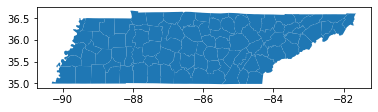

In [23]:
county.plot()

In [24]:
TN=(36.2800424,-85.7026846)
map = folium.Map(location=TN, zoom_start=6.4, titles = "Trout Fishing")

In [25]:
folium.GeoJson(county).add_to(map)

marker_cluster = MarkerCluster().add_to(map)

## plugin for mini map
#minimap = plugins.MiniMap(toggle_display=True)
#
## add minimap to map
#map.add_child(minimap)
#
## add scroll zoom toggler to map
#plugins.ScrollZoomToggler().add_to(map)
#
## add full screen button to map
#plugins.Fullscreen(position='topright').add_to(map)
#
#for row_index, row_values in camp_drop.iterrows():
#    loc = [row_values['lat'], row_values['lon']]
#    pop = str(row_values["park_name"])
#    icon=folium.Icon(color="green",icon="car", prefix='fa')

for row_index, row_values in access.iterrows():
    loc = [row_values['lat'], row_values['lon']]
    pop = str(row_values['Waterway'])
    icon=folium.Icon(color="red",icon="car", prefix='fa')
    
    marker = folium.Marker(location = loc,popup = pop,icon = icon)
    marker.add_to(marker_cluster)
    
for row_index, row_values in stock.iterrows():
    loc = [row_values['lat'], row_values['lon']]
    pop = str(row_values['StreamName'])
    icon=folium.Icon(color="darkblue",icon="phone", prefix='fa')
    
    marker = folium.Marker(location = loc,popup = pop,icon = icon)
    marker.add_to(marker_cluster)
    
    marker = folium.Marker(
        location = loc,
        popup = pop,
    icon = icon)
    
    marker.add_to(marker_cluster)

#nash_map_nw.save('../maps/nw_storms_cluster_final.html') 
    
map